# Model experimentation

In this notebook we'll look into different prediction models.

## Data Manipulation

To experiment with different models, we'll first load the relevant data.

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

df_yf = pd.read_parquet("../data/yfinance/data.parquet")
df_rivm = pd.read_parquet("../data/rivm/COVID-19_aantallen_gemeente_per_dag.parquet")
df_vacc = pd.read_csv("../data/govex/data_tables/vaccine_data/global_data/time_series_covid19_vaccine_global.csv")

In [2]:
display(df_yf)

CL=F                                                        \
           Adj Close      Close       High        Low       Open    Volume   
Date                                                                         
1992-10-12       NaN        NaN        NaN        NaN        NaN       NaN   
1992-10-13       NaN        NaN        NaN        NaN        NaN       NaN   
1992-10-14       NaN        NaN        NaN        NaN        NaN       NaN   
1992-10-15       NaN        NaN        NaN        NaN        NaN       NaN   
1992-10-16       NaN        NaN        NaN        NaN        NaN       NaN   
...              ...        ...        ...        ...        ...       ...   
2021-05-10       NaN  64.919998  65.750000  63.950001  65.570000  448337.0   
2021-05-11       NaN  65.279999  65.500000  63.680000  64.900002  514949.0   
2021-05-12       NaN  66.080002  66.629997  64.970001  65.459999  508519.0   
2021-05-13       NaN  63.820000  65.809998  63.090000  65.750000  547691.0   
2021-05-14       NaN  65.510002  65.620003  63.330002  63.830002  356176.0   

              RDSA.AS                                               \
                 Open       High        Low      Close      Volume   
Date                                                                 
1992-10-12        NaN        NaN        NaN        NaN         NaN   
1992-10-13        NaN        NaN        NaN        NaN         NaN   
1992-10-14        NaN        NaN        NaN        NaN         NaN   
1992-10-15        NaN        NaN        NaN        NaN         NaN   
1992-10-16        NaN        NaN        NaN        NaN         NaN   
...               ...        ...        ...        ...         ...   
2021-05-10  16.624894  16.709998  16.448750  16.476458  12702678.0   
2021-05-11  16.236981  16.278543  15.829274  15.880733  18302712.0   
2021-05-12  15.920315  16.525938  15.809483  16.472500  13758764.0   
2021-05-13  16.242001  16.330000  15.822000  16.222000  12517380.0   
2021-05-14  16.298000  16.648001  16.200001  16.632000  10589647.0   

                  ^AEX                                               
                  Open        High         Low       Close   Volume  
Date                                                                 
1992-10-12  126.382904  127.181557  126.056175  126.945595      0.0  
1992-10-13  126.773155  127.004585  126.491806  126.850296      0.0  
1992-10-14  126.056175  126.555336  126.001724  126.487274      0.0  
1992-10-15  126.097015  126.568954  125.688614  125.824753      0.0  
1992-10-16  126.264915  126.478195  124.858192  125.230293      0.0  
...                ...         ...         ...         ...      ...  
2021-05-10  718.479980  718.479980  710.830017  711.909973  76900.0  
2021-05-11  700.609985  702.080017  689.510010  695.940002  89900.0  
2021-05-12  696.510010  698.989990  692.530029  694.760010  95300.0  
2021-05-13  686.859985  696.530029  677.880005  694.219971  83600.0  
2021-05-14  700.289978  703.330017  695.650024  703.330017  74400.0  

[7342 rows x 16 columns]

In [3]:
display(df_rivm)

,Date_of_report,Date_of_publication,Municipality_code,Municipality_name,Province,Security_region_code,Security_region_name,Municipal_health_service,ROAZ_region,Total_reported,Hospital_admission,Deceased
0,2021-05-01 10:00:00,2020-02-27,GM0014,Groningen,Groningen,VR01,Groningen,GGD Groningen,Acute Zorgnetwerk Noord Nederland,0,0,0
1,2021-05-01 10:00:00,2020-02-27,GM0034,Almere,Flevoland,VR25,Flevoland,GGD Flevoland,SpoedZorgNet,0,0,0
2,2021-05-01 10:00:00,2020-02-27,GM0037,Stadskanaal,Groningen,VR01,Groningen,GGD Groningen,Acute Zorgnetwerk Noord Nederland,0,0,0
3,2021-05-01 10:00:00,2020-02-27,GM0047,Veendam,Groningen,VR01,Groningen,GGD Groningen,Acute Zorgnetwerk Noord Nederland,0,0,0
4,2021-05-01 10:00:00,2020-02-27,GM0050,Zeewolde,Flevoland,VR25,Flevoland,GGD Flevoland,SpoedZorgNet,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
162535,2021-05-01 10:00:00,2021-05-01,None,None,Limburg,VR23,Limburg-Noord,GGD Limburg-Noord,Netwerk Acute Zorg Limburg,1,0,0
162536,2021-05-01 10:00:00,2021-05-01,None,None,Limburg,VR24,Limburg-Zuid,GGD Zuid-Limburg,Netwerk Acute Zorg Limburg,2,0,0
162537,2021-05-01 10:00:00,2021-05-01,None,None,Zuid-Holland,VR15,Haaglanden,GGD Haaglanden,Netwerk Acute Zorg West,2,0,0
162538,2021-05-01 10:00:00,2021-05-01,None,None,Fryslân,VR02,Fryslân,GGD Fryslân,Acute Zorgnetwerk Noord Nederland,2,0,0


In [4]:
display(df_vacc)

,Country_Region,Date,Doses_admin,People_partially_vaccinated,People_fully_vaccinated,Report_Date_String,UID
0,Afghanistan,2021-02-22,0.0,0.0,0.0,2021/02/22,4.0
1,Afghanistan,2021-02-23,0.0,0.0,0.0,2021/02/23,4.0
2,Afghanistan,2021-02-24,0.0,0.0,0.0,2021/02/24,4.0
3,Afghanistan,2021-02-25,0.0,0.0,0.0,2021/02/25,4.0
4,Afghanistan,2021-02-26,0.0,0.0,0.0,2021/02/26,4.0
...,...,...,...,...,...,...,...
15758,Zimbabwe,2021-04-26,411610.0,353834.0,57776.0,2021/04/26,716.0
15759,Zimbabwe,2021-04-27,433939.0,370676.0,63263.0,2021/04/27,716.0
15760,Zimbabwe,2021-04-28,458013.0,388021.0,69992.0,2021/04/28,716.0
15761,Zimbabwe,2021-04-29,477597.0,400771.0,76826.0,2021/04/29,716.0


In [5]:
def preprocess_rivm(df):
    df = df[['Date_of_publication', 'Total_reported', 'Deceased']]
    df.columns = ['date', 'infected', 'deceased']
    df['date'] = df['date'].astype('datetime64[ns]')
    df = df[df['date'] >= "2020-01-01"]
    df = df.groupby(by=['date']).sum()
    df['infected'], df['deceased'] = df['infected'].astype('int64'), df['deceased'].astype('int64')
    df["date"] = df.index
    return df


def plot_rivm(df):
    fig = go.Figure()

    # Create and style traces
    fig.add_trace(go.Scatter(x=df["date"], y=df["infected"], name='Infected', line=dict(color='yellow', width=1), yaxis='y1'))
    fig.add_trace(go.Scatter(x=df["date"], y=df["deceased"], name='Deceased', line=dict(color='red', width=1), yaxis='y2'))

    # Edit the layout
    fig.update_layout(title='Infected and deceased per day in NL from RIVM', xaxis_title='Date', yaxis=dict(title='Infected'), yaxis2=dict(title='Deceased', overlaying='y', side='right'))

    fig.show()

df_rivm = preprocess_rivm(df_rivm)

display(df_rivm)

<ipython-input-5-1c2f1fceb629>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date'].astype('datetime64[ns]')


,infected,deceased,date
date,,,
2020-02-27,0,0,2020-02-27
2020-02-28,1,0,2020-02-28
2020-02-29,1,0,2020-02-29
2020-03-01,3,0,2020-03-01
2020-03-02,5,0,2020-03-02
...,...,...,...
2021-04-27,5320,31,2021-04-27
2021-04-28,8666,11,2021-04-28
2021-04-29,7303,22,2021-04-29


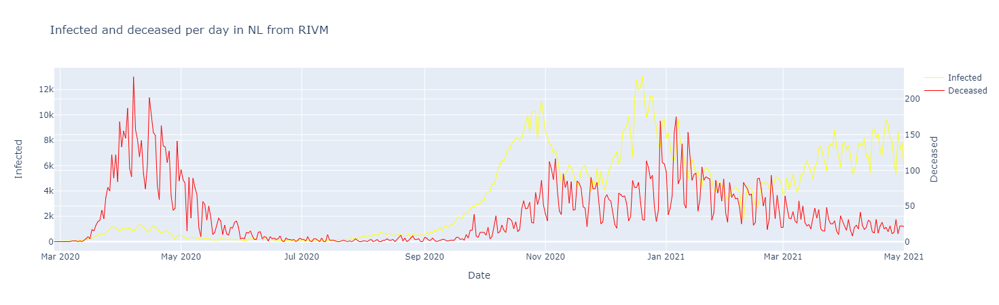

In [6]:
plot_rivm(df_rivm)

In [7]:
stock_columns = ["open", "close", "low", "high"]
color_mapping = {
    "low":"red",
    "high":"green",
    "open":"yellow",
    "close":"blue",
    "volume": "orange"
}

def preprocess_yf(df, idx = "RDSA.AS"):
    df = df[idx]
    df = df.loc["2020-01-01":]
    df.columns = [_.lower() for _ in df.columns]
    df.index.names = ["date"]
    dates = df.index.tolist()
    df.resample("1D")
    df = df.fillna(method="ffill", axis=0)
    df = df.asfreq('1D', method="ffill")
    df["is_original"] = df.index.isin(dates)
    df["day_of_week"] = df.index.dayofweek
    df["is_weekend"] = df["day_of_week"] < 5
    df["is_week"] = ~df["is_weekend"]
    for c in stock_columns + ["volume"]:
        df[f"{c}_is_increase"] = df[c] > df[c].shift()
        df[f"{c}_is_decrease"] = df[c] < df[c].shift()
        df[f"{c}_is_equal"] = df[c] == df[c].shift()
    return df

def plot_stocks(data, traces = stock_columns, idx = "RDSA.AS"):
    fig = go.Figure()

    # Create and style traces
    for c in traces:
        fig.add_trace(go.Scatter(x=data.index, y=data[c], name=c, line=dict(color=color_mapping[c], width=1)))

    # Edit the layout
    fig.update_layout(title=f"{', '.join(traces)} for ({idx})", xaxis_title='Date', yaxis_title='Price')

    fig.show()

df_rdsaas = preprocess_yf(df_yf, "RDSA.AS")
df_aex = preprocess_yf(df_yf, "^AEX")
df_crude_oil = preprocess_yf(df_yf, "CL=F")

display(df_rdsaas)

,open,high,low,close,volume,is_original,day_of_week,is_weekend,is_week,open_is_increase,...,close_is_equal,low_is_increase,low_is_decrease,low_is_equal,high_is_increase,high_is_decrease,high_is_equal,volume_is_increase,volume_is_decrease,volume_is_equal
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,24.589792,24.883471,24.547838,24.748285,6006940.0,True,3,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2020-01-03,24.939410,25.149182,24.850841,25.107227,8818074.0,True,4,True,False,True,...,False,True,False,False,True,False,False,True,False,False
2020-01-04,24.939410,25.149182,24.850841,25.107227,8818074.0,False,5,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-05,24.939410,25.149182,24.850841,25.107227,8818074.0,False,6,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-06,25.312338,25.531432,25.307677,25.312338,8674073.0,True,0,True,False,True,...,False,True,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,16.624894,16.709998,16.448750,16.476458,12702678.0,True,0,True,False,True,...,False,True,False,False,True,False,False,False,True,False
2021-05-11,16.236981,16.278543,15.829274,15.880733,18302712.0,True,1,True,False,False,...,False,False,True,False,False,True,False,True,False,False
2021-05-12,15.920315,16.525938,15.809483,16.472500,13758764.0,True,2,True,False,False,...,False,False,True,False,True,False,False,False,True,False


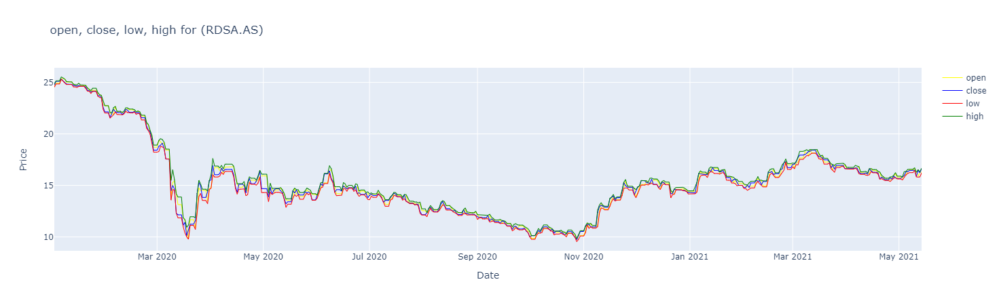

In [8]:
plot_stocks(df_rdsaas, stock_columns, "RDSA.AS")

In [9]:
display(df_rdsaas)

,open,high,low,close,volume,is_original,day_of_week,is_weekend,is_week,open_is_increase,...,close_is_equal,low_is_increase,low_is_decrease,low_is_equal,high_is_increase,high_is_decrease,high_is_equal,volume_is_increase,volume_is_decrease,volume_is_equal
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,24.589792,24.883471,24.547838,24.748285,6006940.0,True,3,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2020-01-03,24.939410,25.149182,24.850841,25.107227,8818074.0,True,4,True,False,True,...,False,True,False,False,True,False,False,True,False,False
2020-01-04,24.939410,25.149182,24.850841,25.107227,8818074.0,False,5,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-05,24.939410,25.149182,24.850841,25.107227,8818074.0,False,6,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-06,25.312338,25.531432,25.307677,25.312338,8674073.0,True,0,True,False,True,...,False,True,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,16.624894,16.709998,16.448750,16.476458,12702678.0,True,0,True,False,True,...,False,True,False,False,True,False,False,False,True,False
2021-05-11,16.236981,16.278543,15.829274,15.880733,18302712.0,True,1,True,False,False,...,False,False,True,False,False,True,False,True,False,False
2021-05-12,15.920315,16.525938,15.809483,16.472500,13758764.0,True,2,True,False,False,...,False,False,True,False,True,False,False,False,True,False


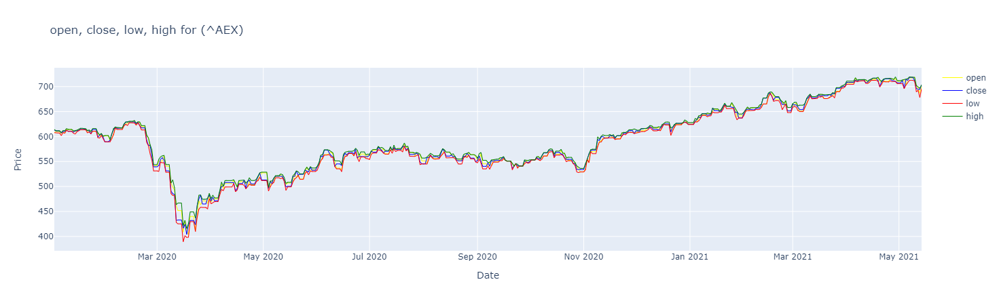

In [10]:
plot_stocks(df_aex, stock_columns, "^AEX")

In [11]:
display(df_aex)

,open,high,low,close,volume,is_original,day_of_week,is_weekend,is_week,open_is_increase,...,close_is_equal,low_is_increase,low_is_decrease,low_is_equal,high_is_increase,high_is_decrease,high_is_equal,volume_is_increase,volume_is_decrease,volume_is_equal
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,608.010010,613.950012,607.750000,612.869995,57960900.0,True,3,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2020-01-03,609.900024,611.580017,607.109985,611.059998,57514500.0,True,4,True,False,True,...,False,False,True,False,False,True,False,False,True,False
2020-01-04,609.900024,611.580017,607.109985,611.059998,57514500.0,False,5,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-05,609.900024,611.580017,607.109985,611.059998,57514500.0,False,6,False,True,False,...,True,False,False,True,False,False,True,False,False,True
2020-01-06,605.950012,607.840027,601.820007,607.239990,66377900.0,True,0,True,False,False,...,False,False,True,False,False,True,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,718.479980,718.479980,710.830017,711.909973,76900.0,True,0,True,False,True,...,False,False,True,False,False,True,False,False,True,False
2021-05-11,700.609985,702.080017,689.510010,695.940002,89900.0,True,1,True,False,False,...,False,False,True,False,False,True,False,True,False,False
2021-05-12,696.510010,698.989990,692.530029,694.760010,95300.0,True,2,True,False,False,...,False,True,False,False,False,True,False,True,False,False


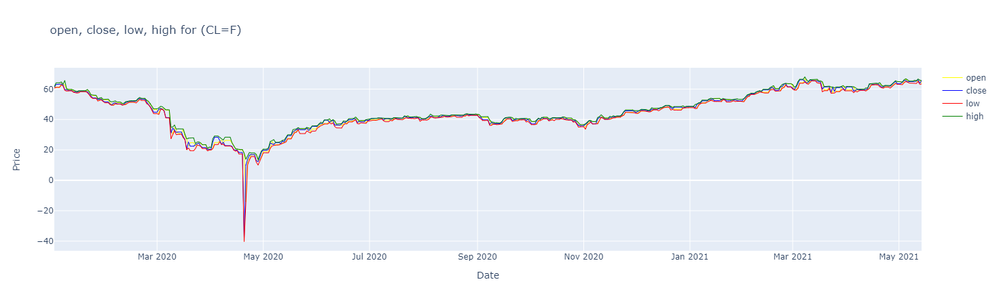

In [12]:
plot_stocks(df_crude_oil, stock_columns, "CL=F")

In [13]:
display(df_crude_oil)

,adj close,close,high,low,open,volume,is_original,day_of_week,is_weekend,is_week,...,close_is_equal,low_is_increase,low_is_decrease,low_is_equal,high_is_increase,high_is_decrease,high_is_equal,volume_is_increase,volume_is_decrease,volume_is_equal
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,NaN,61.180000,61.599998,60.639999,61.599998,486873.0,True,3,True,False,...,False,False,False,False,False,False,False,False,False,False
2020-01-03,NaN,63.049999,64.089996,61.130001,61.180000,885861.0,True,4,True,False,...,False,True,False,False,True,False,False,True,False,False
2020-01-04,NaN,63.049999,64.089996,61.130001,61.180000,885861.0,False,5,False,True,...,True,False,False,True,False,False,True,False,False,True
2020-01-05,NaN,63.049999,64.089996,61.130001,61.180000,885861.0,False,6,False,True,...,True,False,False,True,False,False,True,False,False,True
2020-01-06,NaN,63.270000,64.720001,62.639999,63.709999,724236.0,True,0,True,False,...,False,True,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,NaN,64.919998,65.750000,63.950001,65.570000,448337.0,True,0,True,False,...,False,True,False,False,True,False,False,True,False,False
2021-05-11,NaN,65.279999,65.500000,63.680000,64.900002,514949.0,True,1,True,False,...,False,False,True,False,False,True,False,True,False,False
2021-05-12,NaN,66.080002,66.629997,64.970001,65.459999,508519.0,True,2,True,False,...,False,True,False,False,True,False,False,False,True,False


In [14]:
def preprocess_vacc(df):
    df = df[df["Country_Region"] == "Netherlands"]
    df = df.drop(labels=["UID", "Report_Date_String", "Country_Region"], axis=1)
    df = df.rename(columns={
        "Date": "date",
        "Doses_admin": "total_doses",
        "People_partially_vaccinated": "partial_vaccinations",
        "People_fully_vaccinated": "full_vaccinations"
    })
    df = df.astype({"date": "datetime64",
                    "total_doses": "int64",
                    "partial_vaccinations": "int64",
                    "full_vaccinations": "int64"})
    df["daily_doses"] = df["total_doses"].diff()
    df.set_index("date", inplace=True)
    
    return df

def plot_vacc(df, cols = ["total_doses", "partial_vaccinations", "full_vaccinations", "daily_doses"]):
    fig = go.Figure()

    # Create and style traces
    for c in cols:
        fig.add_trace(go.Scatter(x=df.index, y=df[c], name=c, line=dict(width=1)))

    # Edit the layout
    fig.update_layout(title=f"{', '.join(cols)} for Vaccinations", xaxis_title='Date', yaxis_title='Total')

    fig.show()

df_vacc = preprocess_vacc(df_vacc)

display(df_vacc)

,total_doses,partial_vaccinations,full_vaccinations,daily_doses
date,,,,
2021-01-17,77000,77000,0,NaN
2021-01-18,77000,77000,0,0.0
2021-01-19,77000,77000,0,0.0
2021-01-20,77000,77000,0,0.0
2021-01-21,77000,77000,0,0.0
...,...,...,...,...
2021-04-24,4952724,3635235,943197,0.0
2021-04-25,4991803,3880412,943197,39079.0
2021-04-26,4991803,3880412,943197,0.0


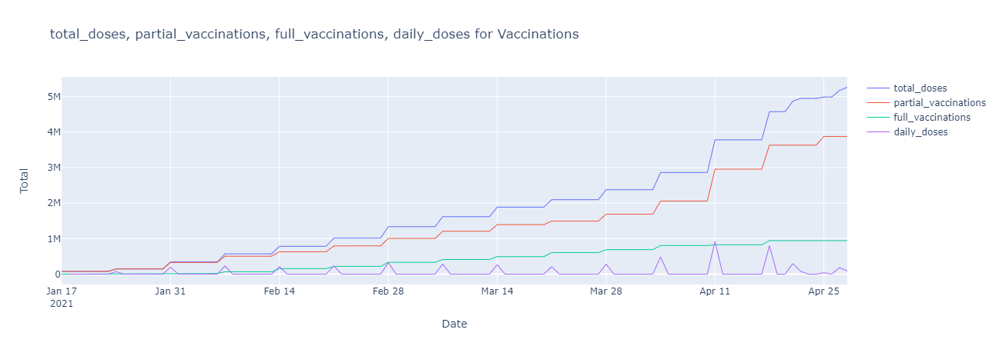

In [15]:
plot_vacc(df_vacc)

### Create master dataset

As we've loaded and preprocessed all seperate datasets, we will create a dataframe that combines all three.

In [16]:
df = df_rivm
df = df.join(df_vacc)
df = df.drop(["date"], axis=1)
df_rdsaas_tmp = df_rdsaas[stock_columns]
df_rdsaas_tmp = df_rdsaas_tmp.rename(columns={_:f"rdsaas_{_}" for _ in stock_columns})
df = df_rdsaas_tmp.join(df)
df_aex_tmp = df_aex[stock_columns]
df_aex_tmp = df_aex_tmp.rename(columns={_:f"aex_{_}" for _ in stock_columns})
df = df.join(df_aex_tmp)
df_crude_oil_tmp = df_crude_oil[stock_columns]
df_crude_oil_tmp = df_crude_oil_tmp.rename(columns={_:f"co_{_}" for _ in stock_columns})
df = df.join(df_crude_oil_tmp)

# Let's add dividends for Shell to the data 
import yfinance as yf
rdsa = yf.Ticker("RDSA.AS")
df_div = pd.DataFrame(rdsa.dividends)
df_div = df_div.rename(columns={"Dividends":"rdsaas_dividends"})
df_div.index.names = ["date"]
df = df.join(df_div)
df = df.fillna(0)

df["dt_iso_year_week"] = df.index.strftime('%Y-%V') # %V is the actual ISO week, but W starts with 0 in a new year, making more sense as a linear variable
df["dt_iso_year_week"] = df["dt_iso_year_week"].replace("2021-53", "2020-53")

df['dt_year'] = df.index.year
df['dt_month'] = df.index.month
df["dt_day"] = df.index.day
df["dt_day_of_week"] = df.index.dayofweek
df["dt_iso_week"] = df.index.strftime('%W').astype("int64") # %V is the actual ISO week, but W starts with 0 in a new year, making more sense as a linear variable
df["dt_is_weekend"] = df["dt_day_of_week"] < 5
df["dt_is_week"] = ~df["dt_is_weekend"]

weekdays = {0: "monday",
           1: "tuesday",
           2: "wednesday",
           3: "thursday",
           4: "friday",
           5: "saturday",
           6: "sunday"}

for i, d in weekdays.items():
    df[f"dt_is_{d}"] = (df["dt_day_of_week"] == i).astype("int64")

display(df)

,rdsaas_open,rdsaas_close,rdsaas_low,rdsaas_high,infected,deceased,total_doses,partial_vaccinations,full_vaccinations,daily_doses,...,dt_iso_week,dt_is_weekend,dt_is_week,dt_is_monday,dt_is_tuesday,dt_is_wednesday,dt_is_thursday,dt_is_friday,dt_is_saturday,dt_is_sunday
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,24.589792,24.748285,24.547838,24.883471,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,1,0,0,0
2020-01-03,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,0,1,0,0
2020-01-04,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,1,0
2020-01-05,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,0,1
2020-01-06,25.312338,25.312338,25.307677,25.531432,0.0,0.0,0.0,0.0,0.0,0.0,...,1,True,False,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,16.624894,16.476458,16.448750,16.709998,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,1,0,0,0,0,0,0
2021-05-11,16.236981,15.880733,15.829274,16.278543,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,1,0,0,0,0,0
2021-05-12,15.920315,16.472500,15.809483,16.525938,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,0,1,0,0,0,0


## Data Discovery

Let's look at some of the data side by side.

In [17]:
def plot_timeline(df, column_colors, x = df.index, second_yaxis = False):
    fig = go.Figure()
    y_axis_cnt = 0
    # Create and style traces
    for column_name, color in column_colors.items():
        y_axis_cnt += 1
        fig.add_trace(go.Scatter(x=x, y=df[column_name], name=column_name.replace("_"," ").title(), line=dict(color=color, width=1), yaxis=f"y{str(y_axis_cnt)}" if second_yaxis else "y1"))

    # Edit the layout
    fig.update_layout(title=', '.join([_.replace('_',' ').title() for _ in column_colors.keys()]), xaxis_title="Timeline", yaxis_title="Total Y1", yaxis2=dict(title='Total Y2', overlaying='y', side='right') if second_yaxis else None)

    return fig

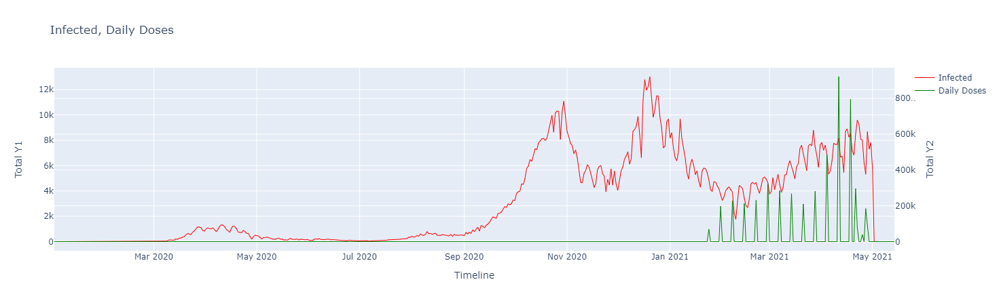

In [18]:
# Testing plot function
plot_timeline(df, {"infected":"red", "daily_doses":"green"}, df.index, True).show()

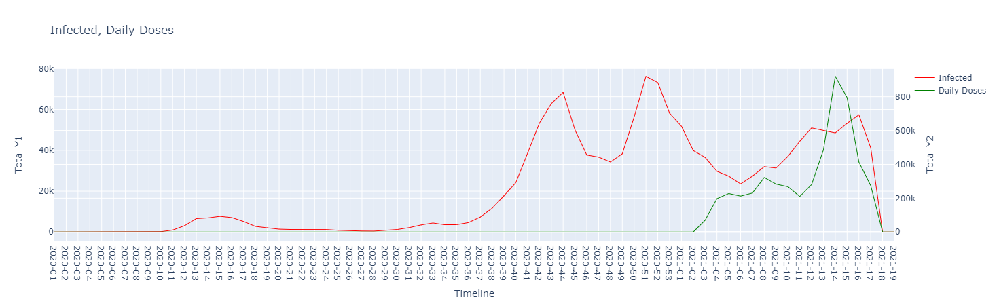

In [19]:
# Plotting Infected vs. Daily doses
df_plot = df.groupby(by=["dt_iso_year_week"]).sum()
fig = plot_timeline(df_plot, {"infected":"red", "daily_doses":"green"}, df_plot.index, True)
fig.update_layout(xaxis_type='category')
fig.show()

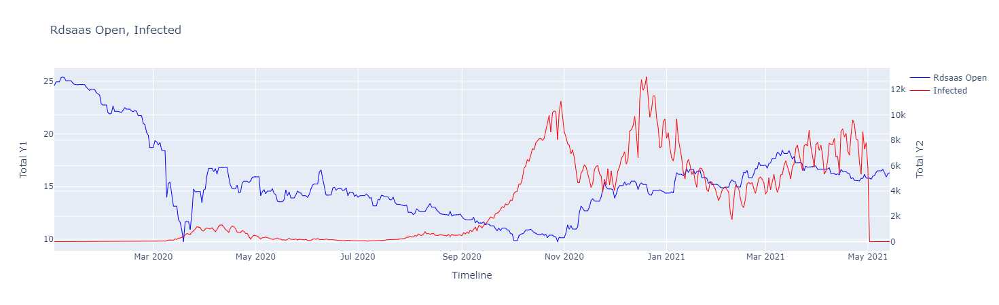

In [20]:
# Plotting RDSA.AS Open vs. Infected
df_plot = df.groupby(by=["date"]).sum()
fig = plot_timeline(df_plot, {"rdsaas_open":"blue", "infected":"red"}, df_plot.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

**Notes**:

As we can see, the Shell index has been hit by the COVID epidemic, but becomes irregular after Q4 2021. This is because at the start of the epidemic Shell announced they would cut dividends, but adjusted this decision around mid October 2020 (source: https://www.rtlnieuws.nl/economie/bedrijven/artikel/5193376/shell-dividend-meevallende-winst-bizar-jos-versteeg)

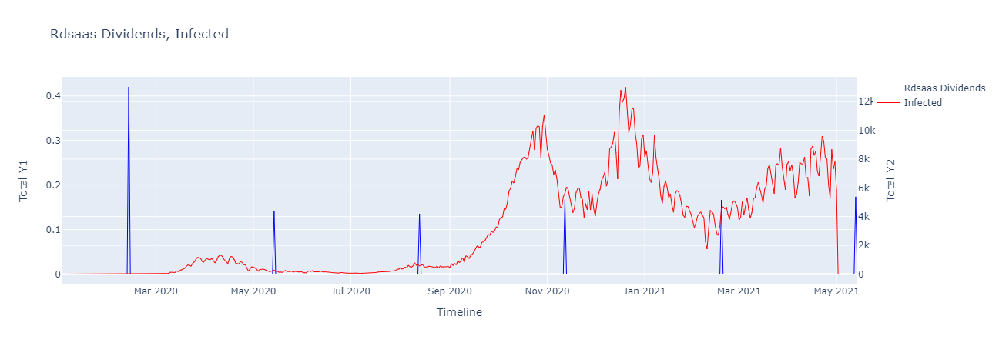

In [21]:
# Plotting RDSA.AS Dividends vs. Infected
df_plot = df.groupby(by=["date"]).sum()
fig = plot_timeline(df_plot, {"rdsaas_dividends":"blue", "infected":"red"}, df_plot.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

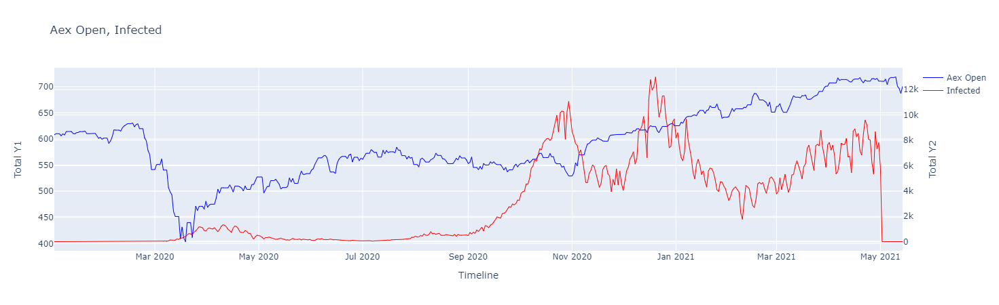

In [22]:
# Plotting ^AEX Open vs. Vaccintated
df_plot = df.groupby(by=["date"]).sum()
fig = plot_timeline(df_plot, {"aex_open":"blue", "infected":"red"}, df_plot.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

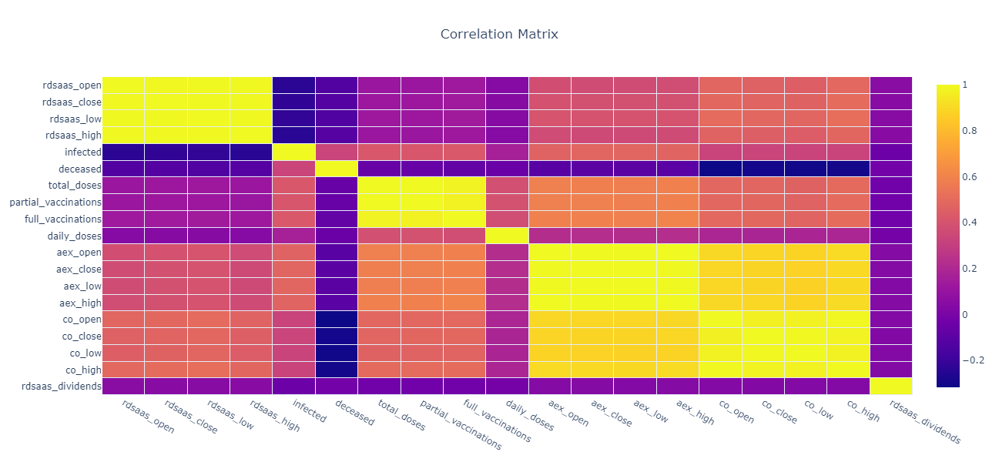

In [23]:
df_plot = df.drop(["dt_iso_year_week"], axis=1)
corr_plot_cols = [_ for _ in df_plot.columns if "dt_" not in _]
heat = go.Heatmap(z=df_plot.corr(),
                  x=corr_plot_cols,
                  y=corr_plot_cols,
                  xgap=1, ygap=1,
                  hoverinfo='text')


title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

**Notes**:

From this correlation plot we can see that vaccinations have the highest correlation compared to the AEX index.

In [24]:
display(df_plot)

,rdsaas_open,rdsaas_close,rdsaas_low,rdsaas_high,infected,deceased,total_doses,partial_vaccinations,full_vaccinations,daily_doses,...,dt_iso_week,dt_is_weekend,dt_is_week,dt_is_monday,dt_is_tuesday,dt_is_wednesday,dt_is_thursday,dt_is_friday,dt_is_saturday,dt_is_sunday
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,24.589792,24.748285,24.547838,24.883471,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,1,0,0,0
2020-01-03,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,0,1,0,0
2020-01-04,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,1,0
2020-01-05,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,0,1
2020-01-06,25.312338,25.312338,25.307677,25.531432,0.0,0.0,0.0,0.0,0.0,0.0,...,1,True,False,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,16.624894,16.476458,16.448750,16.709998,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,1,0,0,0,0,0,0
2021-05-11,16.236981,15.880733,15.829274,16.278543,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,1,0,0,0,0,0
2021-05-12,15.920315,16.472500,15.809483,16.525938,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,0,1,0,0,0,0


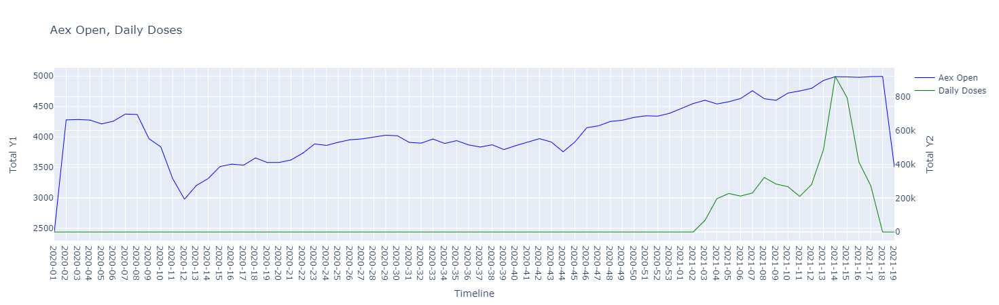

In [25]:
# Plotting ^AEX Open vs. Vaccintated
df_plot = df.groupby(by=["dt_iso_year_week"]).sum()
fig = plot_timeline(df_plot, {"aex_open":"blue", "daily_doses":"green"}, df_plot.index, True)
fig.update_layout(xaxis_type='category')
fig.show()

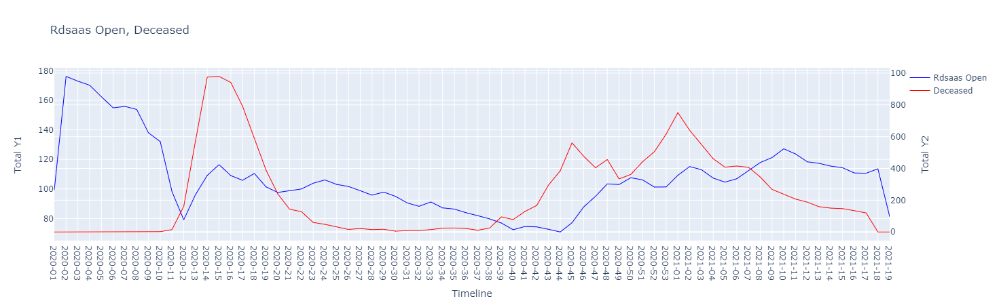

In [26]:
# Plotting RDSA.AS Open vs. Deceased
df_plot = df.groupby(by=["dt_iso_year_week"]).sum()
fig = plot_timeline(df_plot, {"rdsaas_open":"blue", "deceased":"red"}, df_plot.index, True)
fig.update_layout(xaxis_type='category')
fig.show()

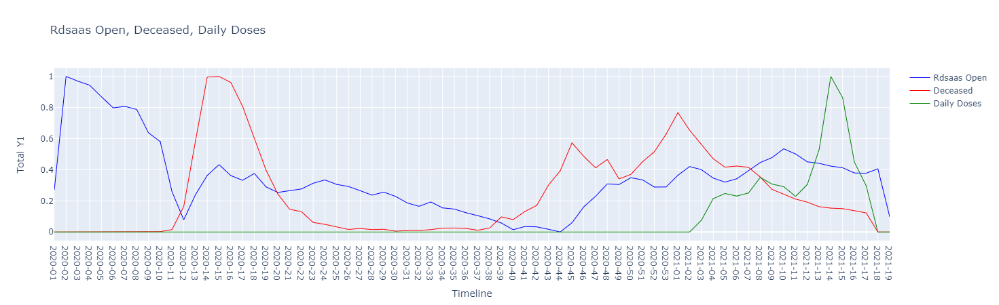

In [27]:
# Possible relationship in normalized columns of RDSA.AS Open, Deceased and Daily Doses?
df_plot = df.groupby(by=["dt_iso_year_week"]).sum()
df_normalized = df_plot[["deceased", "rdsaas_open", "daily_doses"]]
df_normalized = (df_normalized - df_normalized.min()) / (df_normalized.max() - df_normalized.min())

fig = plot_timeline(df_normalized, {"rdsaas_open":"blue", "deceased":"red", "daily_doses":"green"}, df_normalized.index, False)
fig.update_layout(xaxis_type='category')
fig.show()

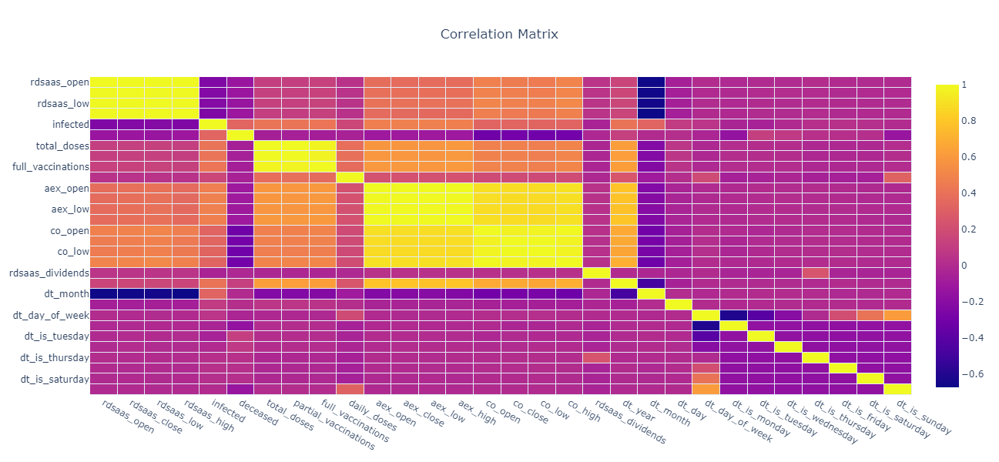

In [28]:
df_plot = df.drop(["dt_iso_year_week", "dt_iso_week", "dt_is_week", "dt_is_weekend"], axis=1)
df_plot = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
corr_plot_cols = df_plot.columns # [_ for _ in df_plot.columns if "dt_" not in _]
heat = go.Heatmap(z=df_plot.corr(),
                  x=corr_plot_cols,
                  y=corr_plot_cols,
                  xgap=1, ygap=1,
                  hoverinfo='text')

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

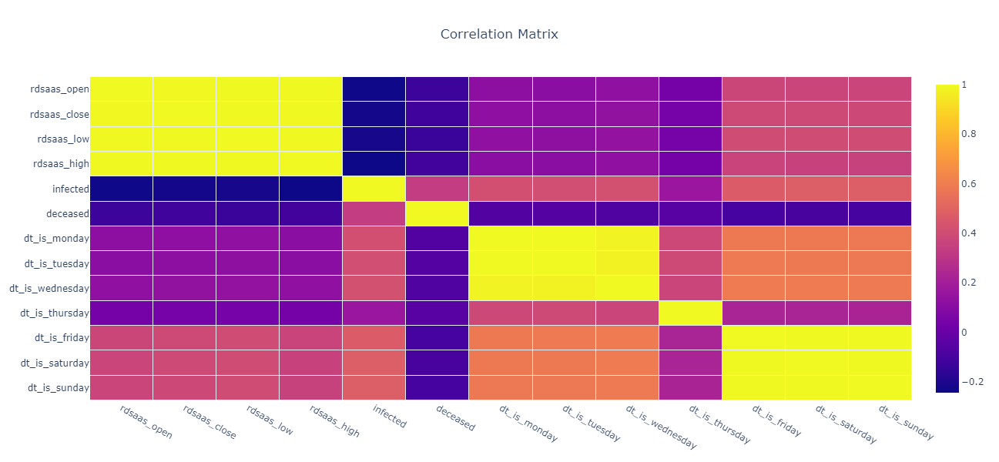

In [29]:
df_plot = df.drop(["dt_iso_year_week", "dt_iso_week", "dt_is_week", "dt_is_weekend"], axis=1)
#corr_plot_cols = df_plot.columns # [_ for _ in df_plot.columns if "dt_" not in _]
weekdays = {0: "monday",
           1: "tuesday",
           2: "wednesday",
           3: "thursday",
           4: "friday",
           5: "saturday",
           6: "sunday"}

for i, d in weekdays.items():
    df_plot[f"dt_is_{d}"] = (df_plot["dt_day_of_week"] == i).astype("int64")

# df_plot = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
corr_plot_cols = ["rdsaas_open", "rdsaas_close", "rdsaas_low", "rdsaas_high", "infected", "deceased"] + [f"dt_is_{_}" for _ in weekdays.values()]
heat = go.Heatmap(z=df_plot.corr(),
                  x=corr_plot_cols,
                  y=corr_plot_cols,
                  xgap=1, ygap=1,
                  hoverinfo='text')

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

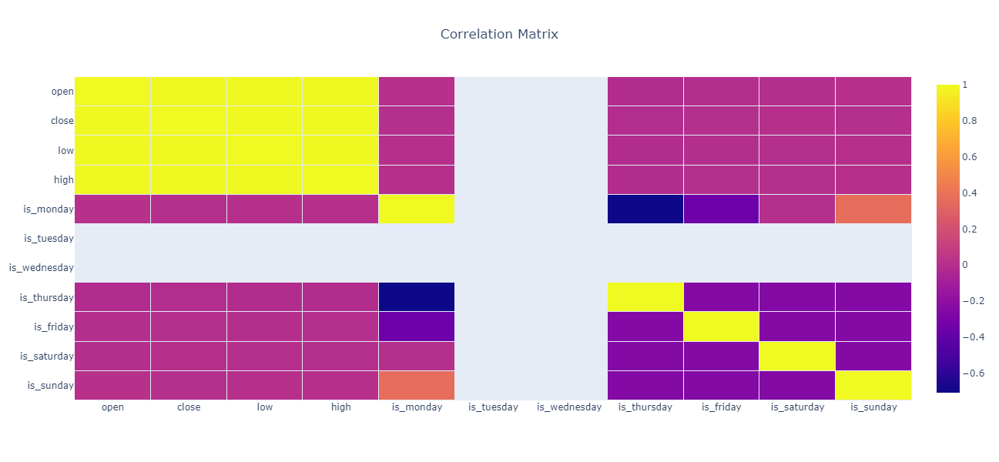

In [30]:
df_plot = df_rdsaas[["open", "close", "low", "high", "day_of_week", "is_week", "is_weekend", "is_original"]]
df_plot = df_plot[df_rdsaas["is_original"]]
df_plot = df_plot.drop("is_original", axis=1)

#corr_plot_cols = df_plot.columns # [_ for _ in df_plot.columns if "dt_" not in _]
weekdays = {0: "monday",
           1: "tuesday",
           2: "wednesday",
           3: "thursday",
           4: "friday",
           5: "saturday",
           6: "sunday"}

df_plot["is_week"] = df_plot["is_week"].astype("int64")
df_plot["is_weekend"] = df_plot["is_weekend"].astype("int64")

for i, d in weekdays.items():
    df_plot[f"is_{d}"] = (df_plot["day_of_week"] == i).astype("int64")

corr_plot_cols = ["open", "close", "low", "high"] + [f"is_{_}" for _ in weekdays.values()]
heat = go.Heatmap(z=df_plot.corr(),
                  x=corr_plot_cols,
                  y=corr_plot_cols,
                  xgap=1, ygap=1,
                  hoverinfo='text')

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed',
                    )
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

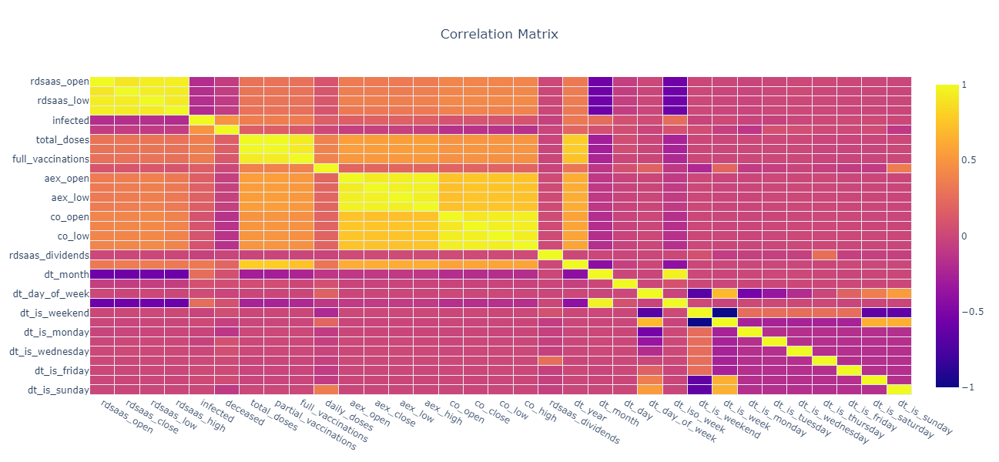

In [31]:
df_plot = df.drop(["dt_iso_year_week"], axis=1)

corr_plot_cols = df_plot.columns 
heat = go.Heatmap(z=df_plot.corr(method="kendall"),
                  x=corr_plot_cols,
                  y=corr_plot_cols,
                  xgap=1, ygap=1,
                  hoverinfo='text')

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

In [32]:
df_plot.corr(method="kendall")

,rdsaas_open,rdsaas_close,rdsaas_low,rdsaas_high,infected,deceased,total_doses,partial_vaccinations,full_vaccinations,daily_doses,...,dt_iso_week,dt_is_weekend,dt_is_week,dt_is_monday,dt_is_tuesday,dt_is_wednesday,dt_is_thursday,dt_is_friday,dt_is_saturday,dt_is_sunday
rdsaas_open,1.000000,0.909178,0.941330,0.950732,-0.182193,-0.073901,0.293349,0.293547,0.279042,0.100466,...,-0.577751,0.001892,-0.001892,-0.017332,-0.000749,0.004887,0.013426,0.002122,-0.001222,-0.001222
rdsaas_close,0.909178,1.000000,0.946852,0.940062,-0.170855,-0.072787,0.301235,0.301409,0.287271,0.105732,...,-0.572534,0.011149,-0.011149,-0.009790,0.007347,0.016600,0.002931,-0.002688,-0.007200,-0.007200
rdsaas_low,0.941330,0.946852,1.000000,0.932702,-0.166050,-0.084084,0.306254,0.306429,0.291354,0.108089,...,-0.561627,0.004212,-0.004212,-0.015052,0.003942,0.007102,0.008211,0.001182,-0.002720,-0.002720
rdsaas_high,0.950732,0.940062,0.932702,1.000000,-0.188735,-0.067636,0.286229,0.286426,0.273827,0.097138,...,-0.583836,0.008551,-0.008551,-0.014661,0.007167,0.011989,0.008211,-0.001700,-0.005522,-0.005522
infected,-0.182193,-0.170855,-0.166050,-0.188735,1.000000,0.490400,0.364991,0.364937,0.348746,0.154063,...,0.253448,-0.018415,0.018415,-0.023176,-0.036490,-0.000592,0.014560,0.021702,0.022601,0.001183
deceased,-0.073901,-0.072787,-0.084084,-0.067636,0.490400,1.000000,0.163842,0.163906,0.124946,0.015815,...,0.075698,0.045390,-0.045390,-0.108751,0.070096,0.055352,0.024220,0.017464,0.037286,-0.095911
total_doses,0.293349,0.301235,0.306254,0.286229,0.364991,0.163842,1.000000,0.999780,0.935598,0.383338,...,-0.249811,0.000605,-0.000605,0.007514,0.007595,0.007757,-0.010979,-0.010979,-0.008295,0.007514
partial_vaccinations,0.293547,0.301409,0.306429,0.286426,0.364937,0.163906,0.999780,1.000000,0.935805,0.383423,...,-0.249947,0.000563,-0.000563,0.007678,0.007678,0.007678,-0.011088,-0.011088,-0.008405,0.007678
full_vaccinations,0.279042,0.287271,0.291354,0.273827,0.348746,0.124946,0.935598,0.935805,1.000000,0.387913,...,-0.204141,0.000713,-0.000713,0.007830,0.007830,0.007830,-0.011219,-0.011219,-0.008751,0.007830
daily_doses,0.100466,0.105732,0.108089,0.097138,0.154063,0.015815,0.383338,0.383423,0.387913,1.000000,...,-0.103675,-0.210746,0.210746,-0.078103,-0.048157,-0.017234,-0.049214,-0.078743,-0.078103,0.350302


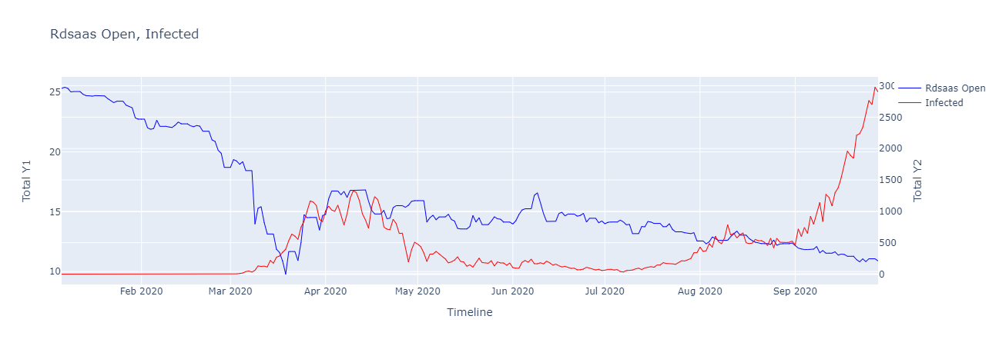

In [33]:
# Plotting RDSA.AS Open vs. Infected
df_plot = df.loc["2020-01-06":"2020-09-28"]
df_plot = df_plot.groupby(by=["date"]).sum()
fig = plot_timeline(df_plot, {"rdsaas_open":"blue", "infected":"red"}, df_plot.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

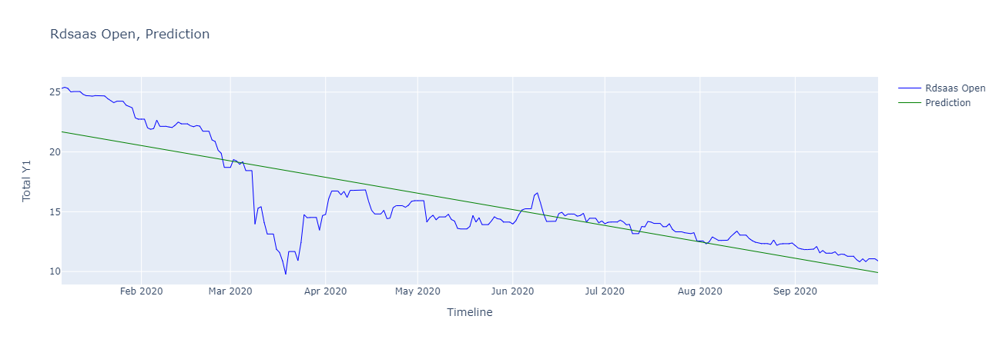

In [34]:
from sklearn import linear_model

X = df_plot.index.factorize()[0].reshape(-1,1)
y = df_plot['rdsaas_open'].values

lr = linear_model.LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)
lr.fit(X, y)
preds = lr.predict(X)

df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_plot.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

In [35]:
lr.score(X, y)

0.6986468863761635

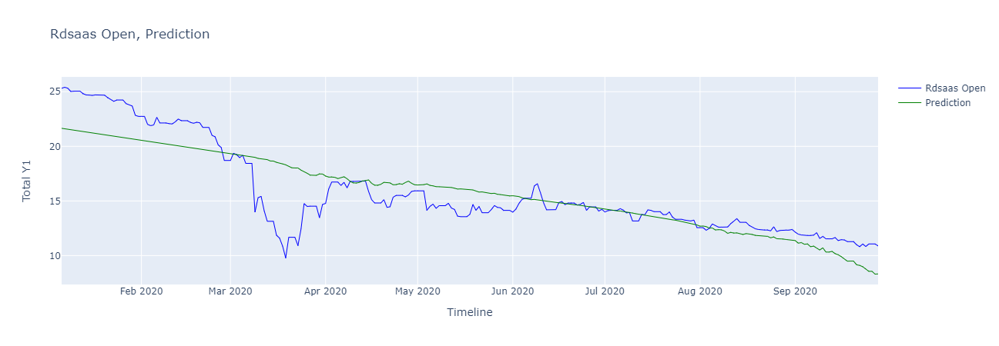

In [36]:
X_0 = df_plot.index.factorize()[0]
X_1 = df_plot["infected"].values
X = [[X_0[i], X_1[i]] for i in range(len(X_0))]
y = df_plot['rdsaas_open'].values

lr = linear_model.LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)
lr.fit(X, y)
preds = lr.predict(X)

df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_plot.index, False)
fig.show()

In [37]:
lr.score(X, y)

0.707675788853845

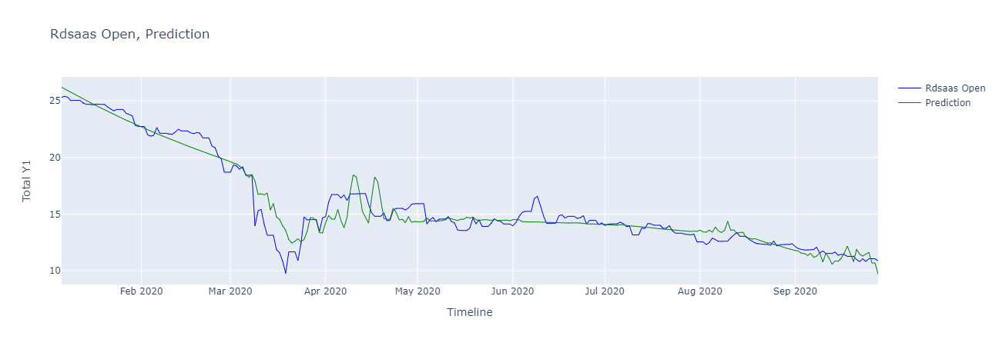

In [38]:
from sklearn.preprocessing import PolynomialFeatures

X_0 = df_plot.index.factorize()[0]
X_1 = df_plot["infected"].values
X = [[X_0[i], X_1[i]] for i in range(len(X_0))]
y = df_plot['rdsaas_open'].values

x_ = PolynomialFeatures(degree=3, include_bias=False).fit_transform(X)

model = linear_model.LinearRegression().fit(x_, y)
preds = model.predict(x_)

df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()


In [39]:
model.score(x_, y)

0.9379284857653751

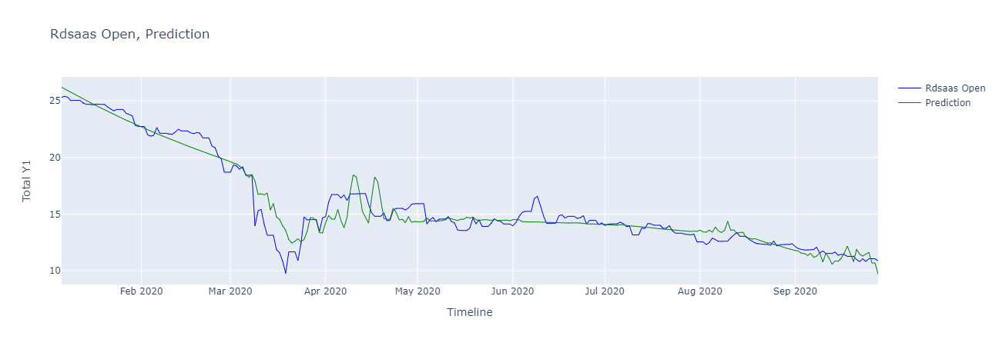

In [40]:
df_plot = df.loc["2020-01-06":"2020-09-28"]
df_plot = df_plot.groupby(by=["date"]).sum()
X_0 = df_plot.index.factorize()[0]
X_1 = df_plot["infected"].values
X = [[X_0[i], X_1[i]] for i in range(len(X_0))]
y = df_plot['rdsaas_open'].values

x_ = PolynomialFeatures(degree=3, include_bias=False).fit_transform(X)
model = linear_model.LinearRegression().fit(x_, y)
preds = model.predict(x_)

df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()


In [41]:
model.score(x_, y)

0.9379284857653751

In [42]:
import statsmodels.api as sm
import numpy as np

df_plot = df.loc["2020-01-06":"2020-09-28"]
df_plot = df_plot.groupby(by=["date"]).sum()
X_0 = df_plot.index.factorize()[0]
X_1 = df_plot["infected"].values
X = np.array([[X_0[i], X_1[i]] for i in range(len(X_0))])
y = np.array(df_plot['rdsaas_open'].values)
X = sm.add_constant(X)
model = sm.OLS(y, X)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                     319.6
Date:                Sun, 16 May 2021   Prob (F-statistic):           3.12e-71
Time:                        16:21:56   Log-Likelihood:                -590.05
No. Observations:                 267   AIC:                             1186.
Df Residuals:                     264   BIC:                             1197.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.6480      0.271     79.890      0.0

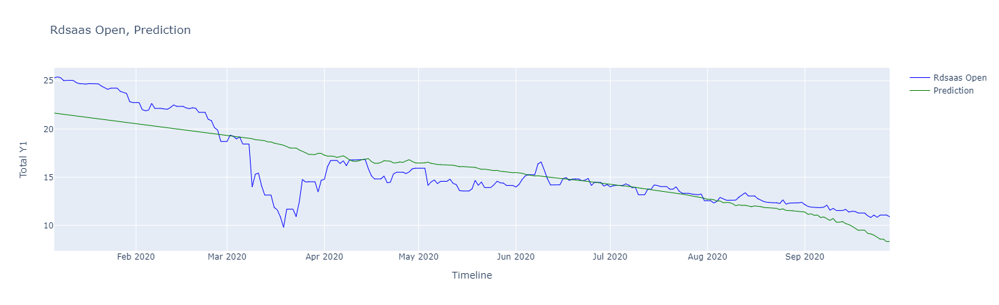

In [43]:
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

In [44]:
df.to_parquet("../data/preprocessed/combined.parquet")

In [45]:
display(df)

,rdsaas_open,rdsaas_close,rdsaas_low,rdsaas_high,infected,deceased,total_doses,partial_vaccinations,full_vaccinations,daily_doses,...,dt_iso_week,dt_is_weekend,dt_is_week,dt_is_monday,dt_is_tuesday,dt_is_wednesday,dt_is_thursday,dt_is_friday,dt_is_saturday,dt_is_sunday
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,24.589792,24.748285,24.547838,24.883471,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,1,0,0,0
2020-01-03,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,True,False,0,0,0,0,1,0,0
2020-01-04,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,1,0
2020-01-05,24.939410,25.107227,24.850841,25.149182,0.0,0.0,0.0,0.0,0.0,0.0,...,0,False,True,0,0,0,0,0,0,1
2020-01-06,25.312338,25.312338,25.307677,25.531432,0.0,0.0,0.0,0.0,0.0,0.0,...,1,True,False,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-10,16.624894,16.476458,16.448750,16.709998,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,1,0,0,0,0,0,0
2021-05-11,16.236981,15.880733,15.829274,16.278543,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,1,0,0,0,0,0
2021-05-12,15.920315,16.472500,15.809483,16.525938,0.0,0.0,0.0,0.0,0.0,0.0,...,19,True,False,0,0,1,0,0,0,0


In [46]:
import statsmodels.api as sm
import numpy as np
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()

# let's try switching out the values for day of the week as one-hot encoded data, year and week as linear data
# infected as a linear value and rdsaas open as the response
start_date = np.datetime64("2020-01-06")
end_date = np.datetime64("2020-06-21")

# subset the data for a specific period, first the 'regular' period before October
df_plot = df.loc[start_date:end_date]
df_plot = df_plot.groupby(by=["date"]).max()

# Add one-hot encoded weekday variables
input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week",
    "infected"
]

X_temp = {}
for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))
    
X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)
X = sm.add_constant(X)
model = sm.OLS(y, X)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.726
Model:                            OLS   Adj. R-squared:                  0.712
Method:                 Least Squares   F-statistic:                     52.60
Date:                Sun, 16 May 2021   Prob (F-statistic):           7.52e-41
Time:                        16:21:57   Log-Likelihood:                -369.08
No. Observations:                 168   AIC:                             756.2
Df Residuals:                     159   BIC:                             784.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.5819      0.297     69.295      0.0

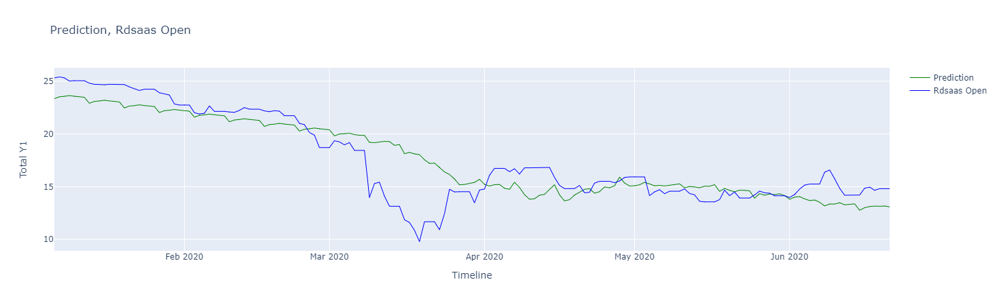

In [47]:
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"prediction":"green", "rdsaas_open":"blue"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

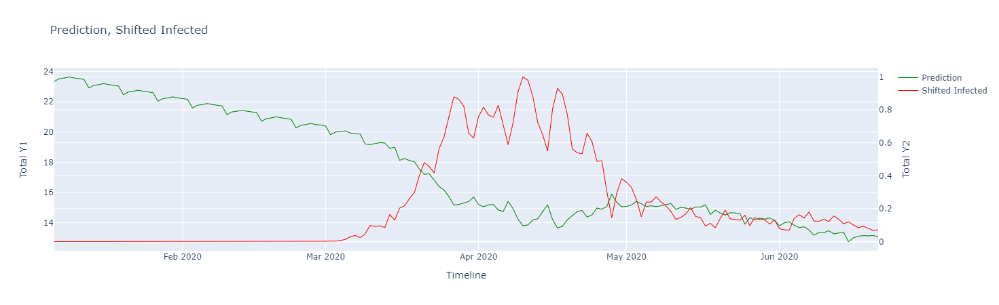

In [48]:
preds = results.predict(X)
df_reg = df_plot
df_reg["shifted_infected"] = X_temp["infected"]
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"prediction":"green", "shifted_infected":"red"}, df_reg.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

**Notes**:

So what we can see is the model works reasonably well with proper feature engineering, but the infected count does not work as expected. The drop in value in RDSA.AS at the start of the data is a response of the *expectation* of what the COVID-19 epidemic would've done. Of course there is no way to know for certain, except in hindsight. But to make it work effectively in the model, we will shift the infected numbers from 1 to 3 weeks prior, because we can see in the charts above that the lowest value in RDSA.AS is about 1 week up to a month prior to the highest value of the infected patients.

In [49]:
import statsmodels.api as sm
import numpy as np
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
X_temp = {}

# let's try switching out the values for day of the week as one-hot encoded data, year and week as linear data
# infected as a linear value and rdsaas open as the response

# Let's add infected as seperate period, shifted by 2 weeks
weeks_shifted = 2
df_plot = df.loc[start_date + (weeks_shifted * 7):end_date + (weeks_shifted * 7)]
df_plot = df_plot.groupby(by=["date"]).max()
X_temp["infected"] = min_max_scaler.fit_transform(df_plot["infected"].astype("int64").values.reshape(-1, 1))

# subset the data for a specific period, first the 'regular' period before October
df_plot = df.loc[start_date:end_date]
df_plot = df_plot.groupby(by=["date"]).max()

input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week"
]

for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))

X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)
X = sm.add_constant(X)
model = sm.OLS(y, X)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     163.9
Date:                Sun, 16 May 2021   Prob (F-statistic):           1.05e-72
Time:                        16:21:57   Log-Likelihood:                -290.94
No. Observations:                 168   AIC:                             599.9
Df Residuals:                     159   BIC:                             628.0
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.4607      0.195    110.174      0.0

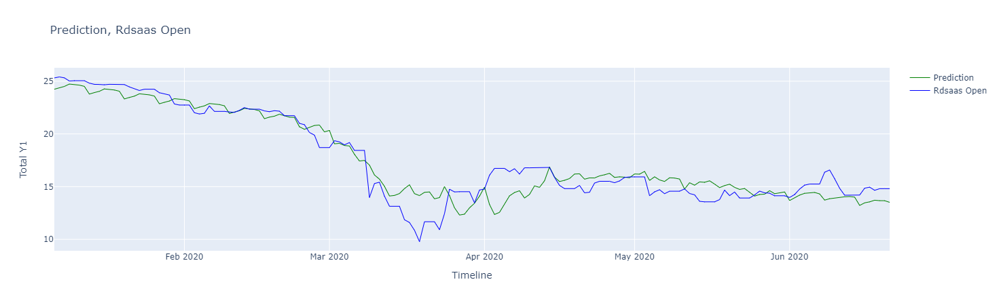

In [50]:
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"prediction":"green", "rdsaas_open":"blue"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

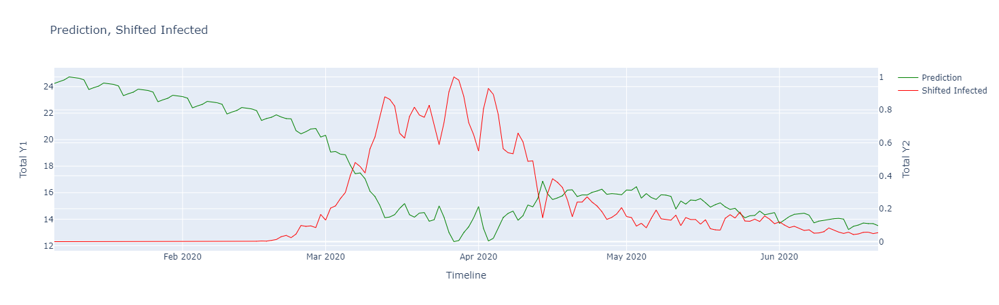

In [51]:
preds = results.predict(X)
df_reg = df_plot
df_reg["shifted_infected"] = X_temp["infected"]
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"prediction":"green", "shifted_infected":"red"}, df_reg.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

**Notes**:

So we've noticed something interesting. When shifting the infected rate 1 to 2 weeks prior, as an indication of the expected impact of the COVID-19 epidemic, the model improves slightly. Although it does not work for the *'second wave'* of infections, which possibly a result of cultural acceptance or more lenient government measures.

### Additional model tests

Before we used OLS, or ordinary least squares regression, with a selection of variables that should be good indicators of change. Below we'll test GLM, which might lead to a better fit.

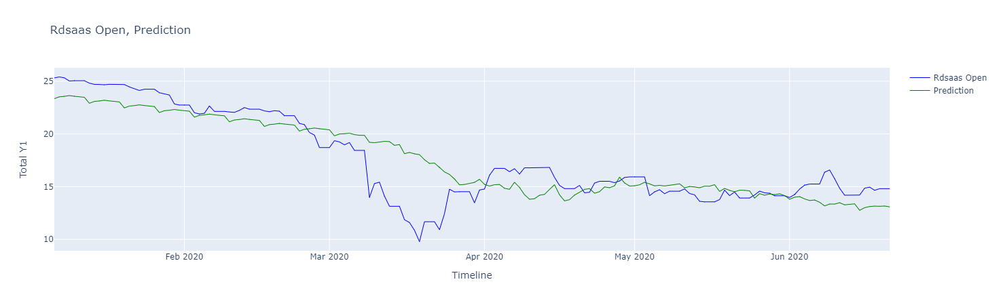

In [60]:
# subset the data for a specific period, let's try the harder period with re-fitting the model
df_plot = df.loc[start_date:end_date]
df_plot = df_plot.groupby(by=["date"]).max()

input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week",
    "infected"
]

for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))

X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)

model = sm.GLM(y, X)
results = model.fit()
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

In [61]:
print(results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  168
Model:                            GLM   Df Residuals:                      159
Model Family:                Gaussian   Df Model:                            8
Link Function:               identity   Scale:                          5.0077
Method:                          IRLS   Log-Likelihood:                -369.08
Date:                Sun, 16 May 2021   Deviance:                       796.22
Time:                        16:23:26   Pearson chi2:                     796.
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            23.3454      0.540     43.194      0.0

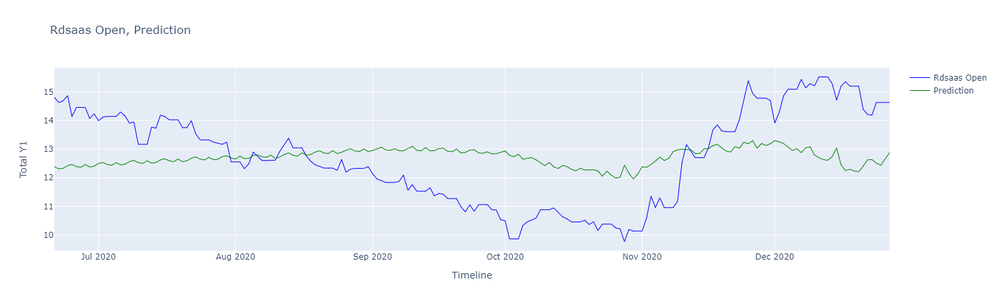

In [63]:
# subset the data for a specific period, let's try the harder period with re-fitting the model
df_plot = df.loc[end_date:"2020-12-27"]
df_plot = df_plot.groupby(by=["date"]).max()

input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week",
    "infected"
]

for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))

X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)

model = sm.GLM(y, X)
results = model.fit()
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

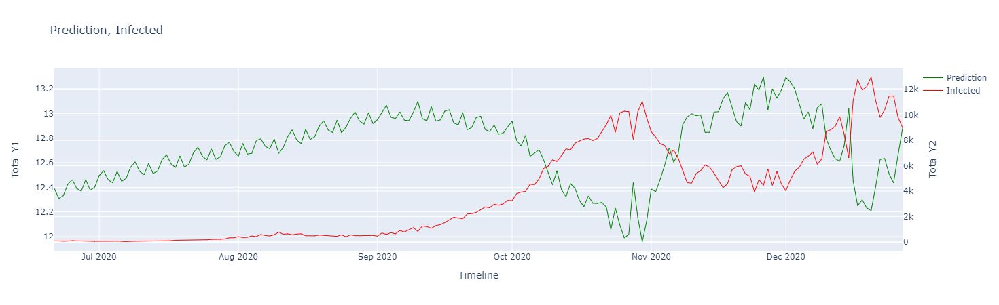

In [65]:
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"prediction":"green", "infected":"red"}, df_reg.index, True)
# fig.update_layout(xaxis_type='category')
fig.show()

In [64]:
print(results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  190
Model:                            GLM   Df Residuals:                      181
Model Family:                Gaussian   Df Model:                            8
Link Function:               identity   Scale:                          2.7029
Method:                          IRLS   Log-Likelihood:                -359.45
Date:                Sun, 16 May 2021   Deviance:                       489.22
Time:                        16:24:56   Pearson chi2:                     489.
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            12.2472      0.408     30.007      0.0

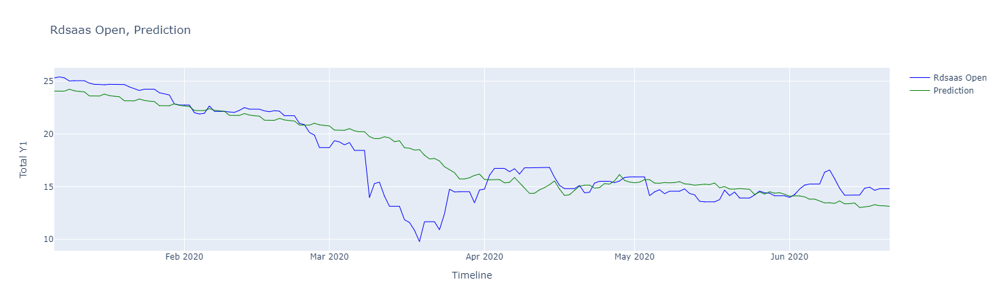

In [66]:
# subset the data for a specific period, let's try the harder period with re-fitting the model
df_plot = df.loc[start_date:end_date]
df_plot = df_plot.groupby(by=["date"]).max()

input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week",
    "infected"
]

for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))

X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)

model = sm.RLM(y, X)
results = model.fit()
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

In [67]:
print(results.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  168
Model:                            RLM   Df Residuals:                      159
Method:                          IRLS   Df Model:                            8
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sun, 16 May 2021                                         
Time:                        16:27:58                                         
No. Iterations:                    26                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            24.0650      0.360     66.784      0.0

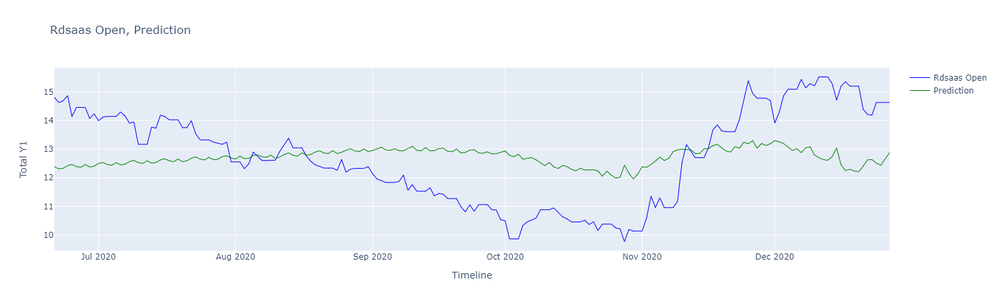

In [74]:
# subset the data for a specific period, let's try the harder period with re-fitting the model
df_plot = df.loc[end_date:"2020-12-27"]
df_plot = df_plot.groupby(by=["date"]).max()

input_variables = [    
    "dt_is_monday",
    "dt_is_tuesday",
    "dt_is_wednesday",
    "dt_is_thursday",
    "dt_is_friday",
    "dt_is_saturday",
    "dt_is_sunday",
    "dt_year",
    "dt_iso_week",
    "infected"
]

for input_variable in input_variables:
    X_temp[input_variable] = min_max_scaler.fit_transform(df_plot[input_variable].astype("int64").values.reshape(-1, 1))

X = np.array([[
    X_temp["dt_is_monday"][i][0],
    X_temp["dt_is_tuesday"][i][0],
    X_temp["dt_is_wednesday"][i][0],
    X_temp["dt_is_thursday"][i][0],
    X_temp["dt_is_friday"][i][0],
    X_temp["dt_is_saturday"][i][0],
    X_temp["dt_is_sunday"][i][0],
    X_temp["dt_year"][i][0],
    X_temp["dt_iso_week"][i][0],
    X_temp["infected"][i][0],
              ] for i in range(len(X_temp["infected"]))])
y = np.array(df_plot['rdsaas_open'].values)

model = sm.RLM(y, X)
results = model.fit()
preds = results.predict(X)
df_reg = df_plot
df_reg["prediction"] = preds
fig = plot_timeline(df_reg, {"rdsaas_open":"blue", "prediction":"green"}, df_reg.index, False)
# fig.update_layout(xaxis_type='category')
fig.show()

In [75]:
print(results.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  190
Model:                            RLM   Df Residuals:                      181
Method:                          IRLS   Df Model:                            8
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sun, 16 May 2021                                         
Time:                        16:30:53                                         
No. Iterations:                     3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            12.2472      0.408     30.007      0.0